# 大学入試とJulia言語（JuliaTokai #21）
### 清水　団　Dan Shimizu ([@dannchu](https://twitter.com/dannchu)) 
### 3/30/2025 


## 自己紹介

- 清水　団（しみず・だん）
- 東京都板橋区 城北中学校・高等学校 に数学科の教員として勤務
- 2021年度より教頭です。


## 東京大(理系）2025・数学

2025年2月25日に行われた東京大学の入学試験の理系の数学の問題を**Julia言語**を用いて，「解く」というよりも「考えて」みました。コードを書くときはできるだけ，`julia`のパッケージを利用しました。


また，[quarto](https://quarto.org)というパブリッシング・システムを用いてWebページを作成しました。基本`Markdown`で，コードの読み込みも容易です。今回は利用していませんが，新たな数式処理の[typst](https://typst.app)も実装可能です。

  

### 第1問

![](r01.png)

In [2]:
using Symbolics

@variables t;

A,B,C,D = [0,0],[0,1],[1,1],[1,0];

f(X,Y,t) = (1-t)*X + t*Y

P(t) = f(A,B,t)
Q(t) = f(B,C,t)
R(t) = f(C,D,t)
S(t) = f(P(t),Q(t),t)
T(t) = f(Q(t),R(t),t)
U(t) = f(S(t),T(t),t)
expand.(U(t))

2-element Vector{Num}:
 3(t^2) - 2(t^3)
     3t - 3(t^2)

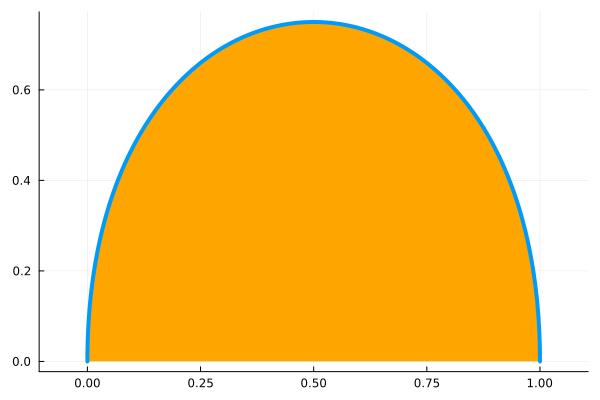

In [3]:
using Plots

plot(t->U(t)[1], t->U(t)[2], 0, 1, 
    aspectratio = true ,
    line = 4, leg = false, fill = (0, :orange))


In [5]:
using QuadGK,Zygote

x(t) = U(t)[1]
y(t) = U(t)[2]

quadgk(t->y(t) * x'(t), 0, 1)


(0.5999999999999999, 1.1102230246251565e-16)

0.0855 + 1.829*x
0.0855 + 1.829*x + 8.38226e-16*x^2
-1.66958e-16 + 3.0*x - 3.0*x^2 + 2.0*x^3


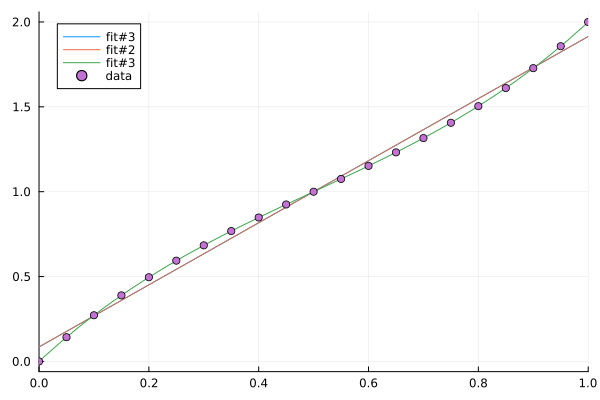

In [7]:

l(a) = quadgk(t -> sqrt(x'(t)^2 + y'(t)^2) , 0, a)[1]

X =0:.05:1
Y = l.(X)

using Polynomials

println(fit(X,Y,1))
println(fit(X,Y,2))
println(fit(X,Y,3))

plot(fit(X,Y,1),xlim=(0,1),label="fit#3")
plot!(fit(X,Y,2),xlim=(0,1),label="fit#2")
plot!(fit(X,Y,3),xlim=(0,1),label="fit#3")
scatter!(X,Y,label="data")



### 第2問

![](r02.png)

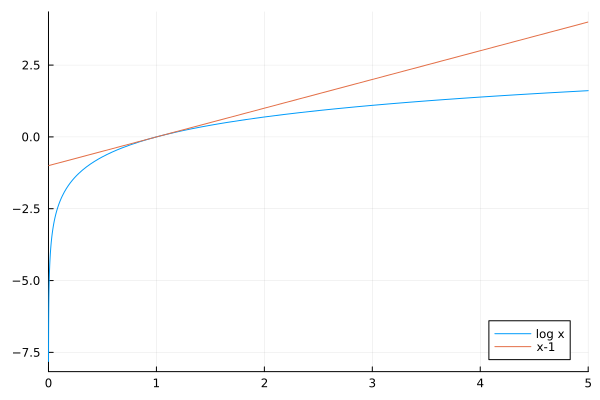

In [8]:
using Plots

plot(log,xlim=(0,5),label="log x")
plot!(x->x-1,xlim=(0,5),label="x-1")


In [9]:
using QuadGK 

f(n) = quadgk(x -> n*log((1+x^(1/n))/2), 1, 2)[1]

@show f(10^6);
@show log(2) - 1/2;

f(10 ^ 6) = 0.19314720411554417
log(2) - 1 / 2 = 0.1931471805599453


### 第3問
![](r03.png)

┌ Info: Saved animation to /var/folders/qd/yc5c6dh155d763gb5rl38lmr0000gn/T/jl_OZgbg3ATQF.gif
└ @ Plots /Users/shimizudan/.julia/packages/Plots/3u4B6/src/animation.jl:156


Plots.AnimatedGif("/var/folders/qd/yc5c6dh155d763gb5rl38lmr0000gn/T/jl_OZgbg3ATQF.gif")
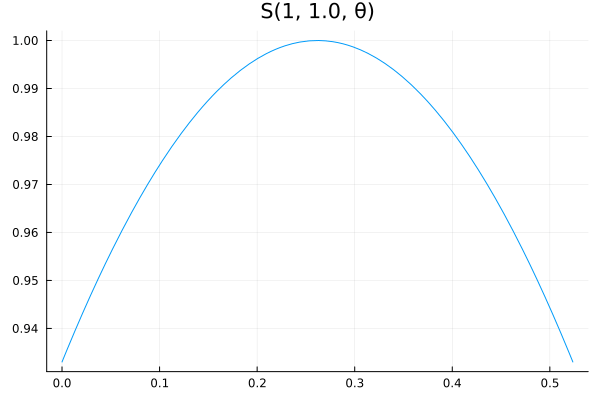

In [10]:

using Plots
S(a,b,θ) =  a*b*sin(π/6)+b^2 * sin(θ) * cos(θ)+a^2 * sin(π/6- θ)*cos(π/6- θ)

# アニメーションの作成
@gif for b in 1:0.005:2
    plot(x -> S(1, b, x), 0, π/6, label =false, 
    title = "S(1, $(round(b,digits=1)), θ)", legend = :topright)
end every 1


In [11]:

using Printf
using Optim

# 関数 S(a, b, θ)
S(a, b, θ) = a*b*sin(π/6) + b^2 * sin(θ)*cos(θ) + a^2 * sin(π/6 - θ)*cos(π/6 - θ)

# θ ∈ [0, π/6] の範囲で最大値を求める関数
function max_S(a, b)
    result = Optim.optimize(θ -> -S(a, b, θ), 0.0, π/6)  # 最大化なのでマイナスを最小化
    θ_max = Optim.minimizer(result)
    S_max = S(a, b, θ_max)
    return θ_max, S_max
end

# 各 a, b の組に対して計算
a = 1
b_list = [1+.1*i for i=0:10]

for b in b_list
    θ, Sval = max_S(a, b)
    @printf "a=1, b=%.4f → θ=%.4f, max S=%.6f\n" b θ Sval
end

a=1, b=1.0000 → θ=0.2618, max S=1.000000
a=1, b=1.1000 → θ=0.3434, max S=1.109933
a=1, b=1.2000 → θ=0.4132, max S=1.239062
a=1, b=1.3000 → θ=0.4708, max S=1.385884
a=1, b=1.4000 → θ=0.5177, max S=1.548764
a=1, b=1.5000 → θ=0.5236, max S=1.724279
a=1, b=1.6000 → θ=0.5236, max S=1.908513
a=1, b=1.7000 → θ=0.5236, max S=2.101407
a=1, b=1.8000 → θ=0.5236, max S=2.302961
a=1, b=1.9000 → θ=0.5236, max S=2.513176
a=1, b=2.0000 → θ=0.5236, max S=2.732051


In [12]:
b_list = [1.4+.01*i for i=0:10]

for b in b_list
    θ, Sval = max_S(a, b)
    @printf "a=1, b=%.4f → θ=%.4f, max S=%.6f\n" b θ Sval
end

a=1, b=1.4000 → θ=0.5177, max S=1.548764
a=1, b=1.4100 → θ=0.5219, max S=1.565878
a=1, b=1.4200 → θ=0.5236, max S=1.583127
a=1, b=1.4300 → θ=0.5236, max S=1.600468
a=1, b=1.4400 → θ=0.5236, max S=1.617895
a=1, b=1.4500 → θ=0.5236, max S=1.635409
a=1, b=1.4600 → θ=0.5236, max S=1.653010
a=1, b=1.4700 → θ=0.5236, max S=1.670697
a=1, b=1.4800 → θ=0.5236, max S=1.688471
a=1, b=1.4900 → θ=0.5236, max S=1.706331
a=1, b=1.5000 → θ=0.5236, max S=1.724279


### 第4問
![](r04.png)

In [13]:
using Primes,Printf

f(a::Int, x::Int) = x^2 + x - a

function N(a, n)
    k = 0
    for i = 1:n
        val = f(a, i)
        if val ≥ 0 && isqrt(val)^2 == val
            k += 1
        end
    end
    return k
end

println(" a   | N(a,1000) | 4a+1   | isprime?")
println("-----|-----------|--------|----------")
for a = 1:120
    count = N(a, 1000)
    val = 4a + 1
    is_p = count == 1 ? string(isprime(val)) : ""
    @printf("%4d | %9d | %6d | %s\n", a, count, val, is_p)
end

 a   | N(a,1000) | 4a+1   | isprime?
-----|-----------|--------|----------
   1 |         1 |      5 | true
   2 |         2 |      9 | 
   3 |         1 |     13 | true
   4 |         1 |     17 | true
   5 |         2 |     21 | 
   6 |         2 |     25 | 
   7 |         1 |     29 | true
   8 |         2 |     33 | 
   9 |         1 |     37 | true
  10 |         1 |     41 | true
  11 |         3 |     45 | 
  12 |         2 |     49 | 
  13 |         1 |     53 | true
  14 |         2 |     57 | 
  15 |         1 |     61 | true
  16 |         2 |     65 | 
  17 |         2 |     69 | 
  18 |         1 |     73 | true
  19 |         2 |     77 | 
  20 |         3 |     81 | 
  21 |         2 |     85 | 
  22 |         1 |     89 | true
  23 |         2 |     93 | 
  24 |         1 |     97 | true
  25 |         1 |    101 | true
  26 |         4 |    105 | 
  27 |         1 |    109 | true
  28 |         1 |    113 | true
  29 |         3 |    117 | 
  30 |         2 |    121 | 

### 第5問
![](r05.png)

In [14]:
using Combinatorics

# 操作 T_i: i番目とi+1番目の値を比較し、左の方が大きければ入れ替える
function apply_T!(perm, i)
    if perm[i] > perm[i + 1]
        perm[i], perm[i + 1] = perm[i + 1], perm[i]
    end
end

# 1回の操作ループ：T₁～Tₙ₋₁ → Tₙ₋₁～T₁
function perform_all_T!(perm)
    n = length(perm)
    for i in 1:n-1
        apply_T!(perm, i)
    end
    for i in n-1:-1:1
        apply_T!(perm, i)
    end
end

# 並べ替え後に昇順になる初期順列を全て集める
function valid_permutations(n)
    target = collect(1:n)
    results = []

    for perm in permutations(1:n)
        temp = collect(perm)
        perform_all_T!(temp)
        if temp == target
            push!(results, perm)
        end
    end

    return results
end

# 実行例：n = 10 のとき
valid_permutations(10)



31520-element Vector{Any}:
 [1, 2, 3, 4, 5, 6, 7, 8, 9, 10]
 [1, 2, 3, 4, 5, 6, 7, 8, 10, 9]
 [1, 2, 3, 4, 5, 6, 7, 9, 8, 10]
 [1, 2, 3, 4, 5, 6, 7, 9, 10, 8]
 [1, 2, 3, 4, 5, 6, 7, 10, 8, 9]
 [1, 2, 3, 4, 5, 6, 7, 10, 9, 8]
 [1, 2, 3, 4, 5, 6, 8, 7, 9, 10]
 [1, 2, 3, 4, 5, 6, 8, 7, 10, 9]
 [1, 2, 3, 4, 5, 6, 8, 9, 7, 10]
 [1, 2, 3, 4, 5, 6, 8, 9, 10, 7]
 ⋮
 [10, 2, 3, 4, 5, 1, 7, 8, 9, 6]
 [10, 2, 3, 4, 5, 6, 1, 7, 8, 9]
 [10, 2, 3, 4, 5, 6, 1, 7, 9, 8]
 [10, 2, 3, 4, 5, 6, 1, 8, 7, 9]
 [10, 2, 3, 4, 5, 6, 1, 8, 9, 7]
 [10, 2, 3, 4, 5, 6, 7, 1, 8, 9]
 [10, 2, 3, 4, 5, 6, 7, 1, 9, 8]
 [10, 2, 3, 4, 5, 6, 7, 8, 1, 9]
 [10, 2, 3, 4, 5, 6, 7, 8, 9, 1]

In [15]:

# 最初の10個の順列を表示
for i in 1:10
    println(valid_permutations(i)|>length)
end

1
2
6
20
68
232
792
2704
9232
31520


### 第6問
![](r06.png)

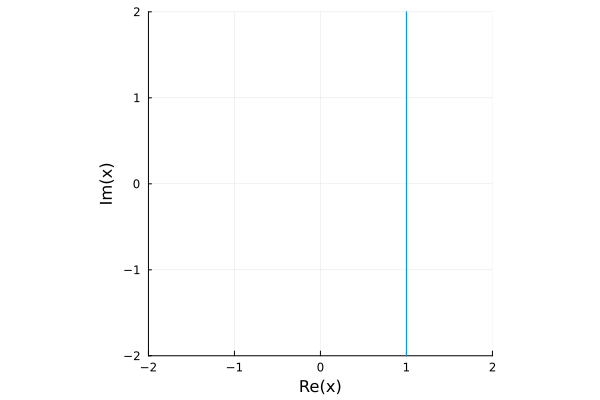

In [16]:
using Plots
# 曲線C上の点を生成（z such that |z - 1/2| = 1/2）
function generate_C(N=500)
    θ = range(0, 2π, length=N)
    return [1/2 + 1/2 * cis(t) for t in θ if abs(1/2 + 1/2 * cis(t)) > 1e-6]  # 原点を除く
end

plot(1 ./generate_C(),aspectratio=true,
xlim=(-2,2),ylim=(-2,2),label="1/z",legend=false)

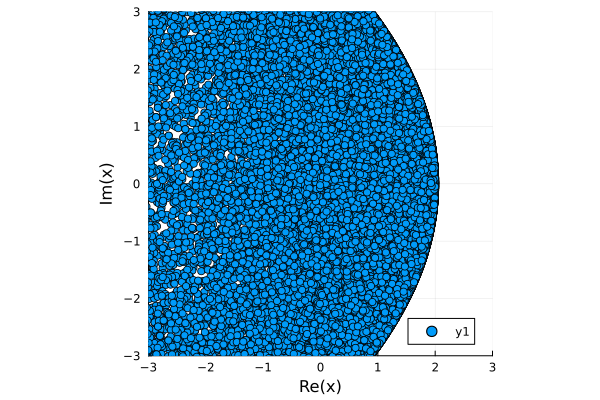

In [17]:

# (2) α ≠ β に対して 1/α^2 + 1/β^2 のとる範囲を図示
function plot_sum_inv_squares()
    C = generate_C(10^3)
    points = ComplexF64[]
    for _ = 1:10^5
        α, β = rand(C), rand(C)
        push!(points, 1/α^2 + 1/β^2)
    end
    scatter(points,aspectratio=true,
    xlim=(-3,3),ylim=(-3,3),)
end

plot_sum_inv_squares()

(3) Re(1/γ) の最大:0.5
(3) Re(1/γ) の最小:-0.06250000000000001


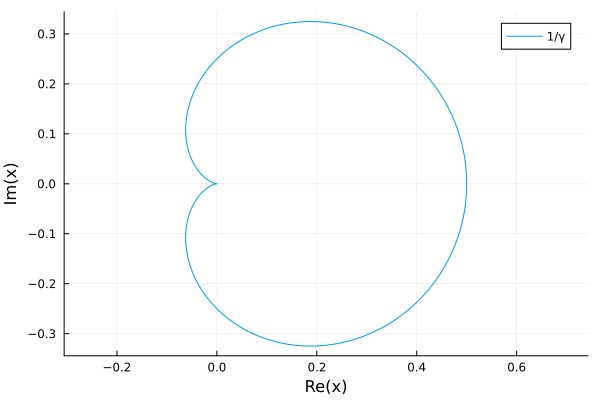

In [18]:
# (3) C上にない点を使って Re(1/γ) の最大・最小を求める
# まあ，境界でmax,minを取るとしましょう。
C  = generate_C(1000)
f(z) = 2/z^2
points = f.(C)
w = 1 ./ points
println("(3) Re(1/γ) の最大:", maximum(real.(w)))
println("(3) Re(1/γ) の最小:", minimum(real.(w)))
plot(w,aspectratio=true,label="1/γ")

(3) Re(1/γ) の最大:0.5
(3) Re(1/γ) の最小:-0.06250000000000001


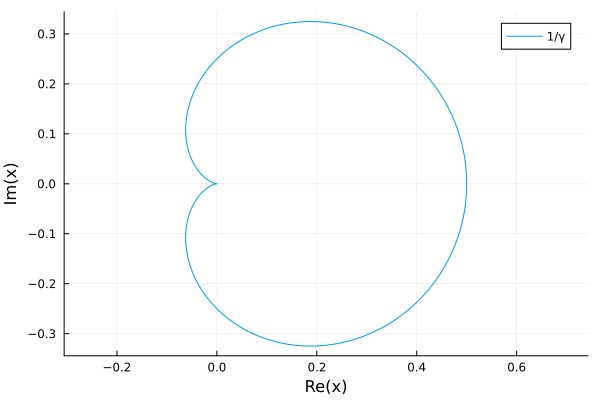

In [18]:
# (3) C上にない点を使って Re(1/γ) の最大・最小を求める
# まあ，境界でmax,minを取るとしましょう。
C  = generate_C(1000)
f(z) = 2/z^2
points = f.(C)
w = 1 ./ points
println("(3) Re(1/γ) の最大:", maximum(real.(w)))
println("(3) Re(1/γ) の最小:", minimum(real.(w)))
plot(w,aspectratio=true,label="1/γ")